# Working with Quadkey in Vgrid DGGS

[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeoshub/vgrid/blob/main/docs/notebooks/16_quadkey.ipynb)
[![image](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/opengeoshub/vgrid/HEAD?filepath=docs/notebooks/16_quadkey.ipynb)
[![image](https://studiolab.sagemaker.aws/studiolab.svg)](https://studiolab.sagemaker.aws/import/github/opengeoshub/vgrid/blob/main/docs/notebooks/16_quadkey.ipynb)
[![image](https://jupyterlite.rtfd.io/en/latest/_static/badge.svg)](https://jupyterlite.gishub.vn/lab/index.html?path=notebooks/vgrid/16_quadkey.ipynb)

Full Vgrid DGGS documentation is available at [vgrid document](https://vgrid.gishub.vn).

To work with Vgrid DGGS directly in GeoPandas and Pandas, please use [vgridpandas](https://pypi.org/project/vgridpandas/). Full Vgridpandas DGGS documentation is available at [vgridpandas document](https://vgridpandas.gishub.vn).

To work with Vgrid DGGS in QGIS, install the [Vgrid Plugin](https://plugins.qgis.org/plugins/vgridtools/).

To visualize DGGS in Maplibre GL JS, try the [vgrid-maplibre](https://www.npmjs.com/package/vgrid-maplibre) library.

For an interactive demo, visit the [Vgrid Homepage](https://vgrid.vn).

### Install vgrid
Uncomment the following line to install [vgrid](https://pypi.org/project/vgrid/).

In [1]:
# %pip install vgrid --upgrade

### latlon2quadkey

In [2]:
from vgrid.conversion.latlon2dggs import latlon2quadkey

lat = 10.775276
lon = 106.706797
res = 14
quadkey_id = latlon2quadkey(lat, lon, res)
quadkey_id

'13223011131020'

### Quadkey to Polygon

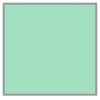

In [3]:
from vgrid.conversion.dggs2geo.quadkey2geo import quadkey2geo

quadkey_geo = quadkey2geo(quadkey_id)
quadkey_geo

### Quadkey to GeoJSON        

In [ ]:
from vgrid.conversion.dggs2geo.quadkey2geo import quadkey2geojson

quadkey_geojson = quadkey2geojson(quadkey_id)
# quadkey_geojson

### Vector to Quadkey

### Multi(Point) to Quadkey

Processing features: 100%|██████████| 12/12 [00:00<00:00, 2942.17it/s]


<Axes: >

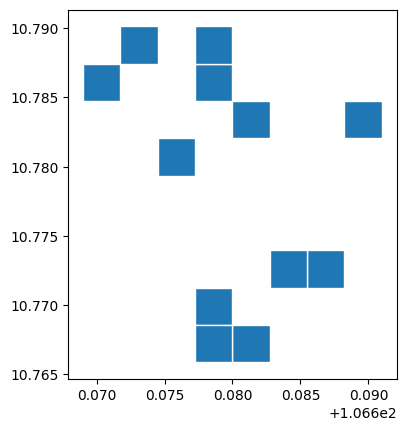

In [1]:
from vgrid.conversion.vector2dggs.vector2quadkey import vector2quadkey

file_path = (
    "https://raw.githubusercontent.com/opengeoshub/vopendata/main/shape/point.geojson"
)
point_to_quadkey = vector2quadkey(
    file_path,
    # resolution=17,
    topology=True,
    output_format="gpd",
)
point_to_quadkey.plot(edgecolor="white")

### Multi(Polygon) to Quadkey

Processing features: 100%|██████████| 4/4 [00:00<00:00, 26.18it/s]


<Axes: >

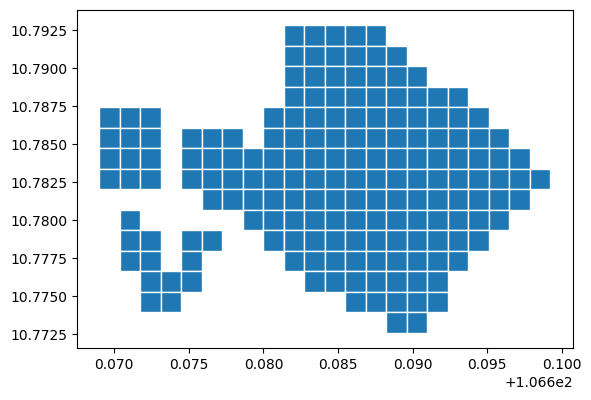

In [5]:
from vgrid.conversion.vector2dggs.vector2quadkey import vector2quadkey

file_path = (
    "https://raw.githubusercontent.com/opengeoshub/vopendata/main/shape/polygon.geojson"
)
vector_to_quadkey = vector2quadkey(
    file_path, resolution=18, compact=False, predicate="intersects", output_format="gpd"
)
# Visualize the output
vector_to_quadkey.plot(edgecolor="white")

### Quadkey Compact

<Axes: >

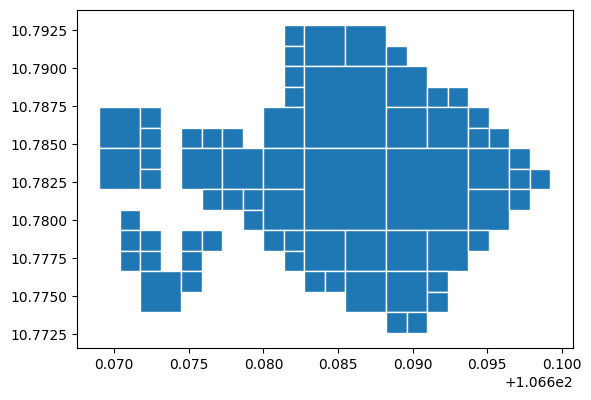

In [6]:
from vgrid.conversion.dggscompact.quadkeycompact import quadkeycompact

quadkey_compacted = quadkeycompact(
    vector_to_quadkey, quadkey_id="quadkey", output_format="gpd"
)
quadkey_compacted.plot(edgecolor="white")

### Quadkey Expand

<Axes: >

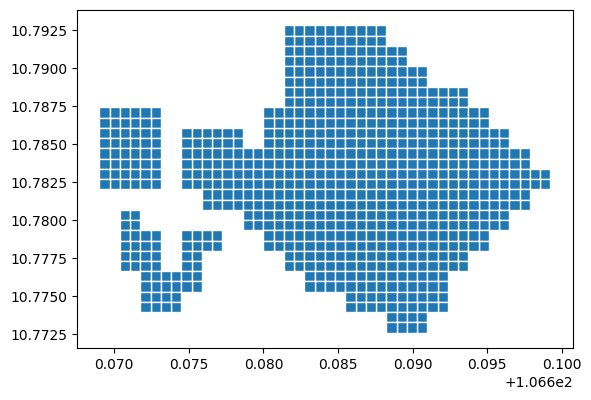

In [7]:
from vgrid.conversion.dggscompact.quadkeycompact import quadkeyexpand

quadkey_expanded = quadkeyexpand(vector_to_quadkey, resolution=19, output_format="gpd")
quadkey_expanded.plot(edgecolor="white")

### Quadkey Binning

Generating Quadkey DGGS: 1015 cells [00:00, 1444.73 cells/s]


<Axes: >

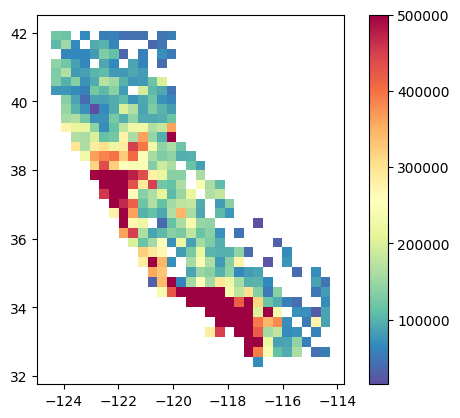

In [1]:
from vgrid.binning.quadkeybin import quadkeybin

file_path = (
    "https://raw.githubusercontent.com/opengeoshub/vopendata/main/csv/housing.csv"
)
stats = "max"
numeric_col = "median_house_value"

quadkey_bin = quadkeybin(
    file_path,
    resolution=10,
    stats=stats,
    numeric_col=numeric_col,
    # category_col="category",
    output_format="gpd",
)
quadkey_bin.plot(
    column=f"{numeric_col}_{stats}",  # numeric column to base the colors on
    cmap="Spectral_r",  # color scheme (matplotlib colormap)
    legend=True,
    linewidth=0.2,  # boundary width (optional)
)

### Quadkey Resampling

Generating A5 cells: 100%|██████████| 2011/2011 [00:00<00:00, 2847.16 cells/s]


<Axes: >

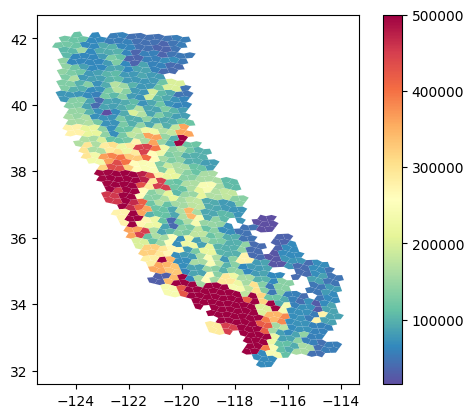

In [2]:
from vgrid.conversion.dggsresample import dggsresample

quadkey_resample = dggsresample(
    source_dggs=quadkey_bin,
    dggs_from="quadkey",
    dggs_to="a5",
    method="nearest",  # area_weighted, nearest
    dggs_col="quadkey",
    resample_col=f"{numeric_col}_{stats}",  # column on h3_bin with numbers
    fix_antimeridian=None,
    split_antimeridian=False,
)
quadkey_resample.plot(
    column=f"{numeric_col}_{stats}",  # numeric column to base the colors on
    cmap="Spectral_r",  # color scheme (matplotlib colormap)
    legend=True,
    linewidth=0.2,  # boundary width (optional)
)

### Raster to Quadkey

#### Download and open raster

rgb.tif already exists. Skip downloading. Set overwrite=True to overwrite.
{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 240, 'height': 147, 'count': 3, 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'), 'transform': Affine(2.6640125000199077e-06, 0.0, 106.708118755,
       0.0, -2.6640136054383103e-06, 10.812568272)}


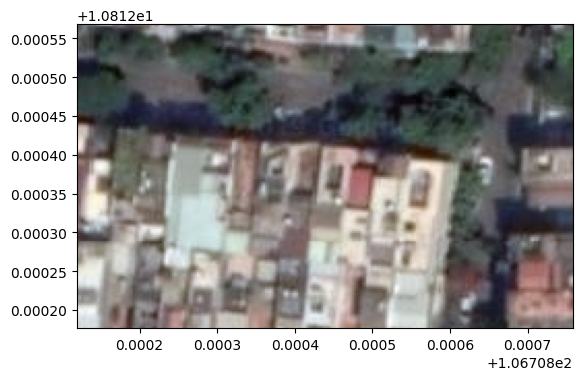

<Axes: >

In [5]:
from vgrid.utils.io import download_file
import rasterio
from rasterio.plot import show

raster_url = (
    "https://raw.githubusercontent.com/opengeoshub/vopendata/main/raster/rgb.tif"
)
raster_file = download_file(raster_url)
src = rasterio.open(raster_file, "r")
print(src.meta)
show(src)

#### Convert raster to Quadkey

In [9]:
# %pip install folium

In [4]:
from vgrid.conversion.raster2dggs.raster2quadkey import raster2quadkey

raster_to_quadkey = raster2quadkey(
    raster_file,
    method="nearest",  # nearest. binning
    stats="mean",
    output_format="gpd",
)

# Visualize the output
import folium

m = folium.Map(tiles="CartoDB positron", max_zoom=28)

quadkey_layer = folium.GeoJson(
    raster_to_quadkey,
    style_function=lambda x: {
        "fillColor": f"rgb({x['properties']['band_1']}, {x['properties']['band_2']}, {x['properties']['band_3']})",
        "fillOpacity": 1,
        "color": "black",
        "weight": 1,
    },
    popup=folium.GeoJsonPopup(
        fields=["quadkey", "band_1", "band_2", "band_3"],
        aliases=["Quadkey ID", "Band 1", "Band 2", "Band 3"],
        style="""
            background-color: white;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """,
    ),
).add_to(m)

m.fit_bounds(quadkey_layer.get_bounds())

# Display the map
m

Cell size: 0.08638527081938627 m2
Nearest Quadkey resolution determined: 26
Method: nearest_neighbour


Generating Quadkey DGGS: 174 cells [00:00, 1735.55 cells/s]

Generating Quadkey DGGS: 9120 cells [00:06, 1470.62 cells/s]
Reading raster pixel centers: 100%|██████████| 14/14 [00:02<00:00,  6.85 block/s]


### Quadkey Generator

Generating Quadkey DGGS: 100%|██████████| 39/39 [00:00<00:00, 12513.61 cells/s]


<Axes: >

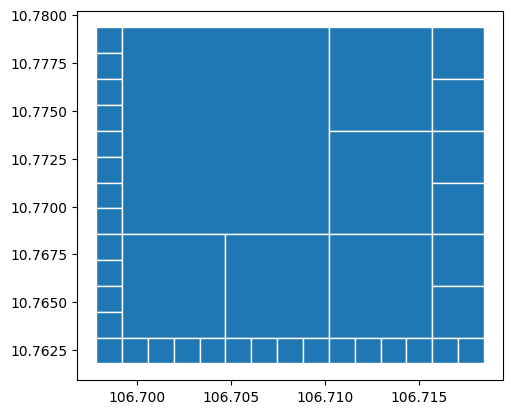

In [1]:
from vgrid.generator.quadkeygrid import quadkeygrid

# quadkey_grid = quadkeygrid(resolution=2,output_format="gpd")
quadkey_grid = quadkeygrid(
    resolution=18,
    bbox=[106.699007, 10.762811, 106.717674, 10.778649],
    compact=True,
    output_format="gpd",
)
quadkey_grid.plot(edgecolor="white")

### Quadkey Inspect

In [1]:
from vgrid.stats.quadkeystats import quadkeyinspect

resolution = 7
quadkey_inspect = quadkeyinspect(resolution)
quadkey_inspect.head()

Generating Quadkey DGGS: 16384 cells [00:01, 10207.75 cells/s]


,quadkey,resolution,center_lat,center_lon,cell_width,cell_height,cell_area,cell_perimeter,geometry,crossed,norm_area,ipq,zsc,cvh
0,0000000,7,84.926801,-178.59375,28454.129379,27771.076917,7.711209e+08,111092.677554,"POLYGON ((-180 84.80247, -177.1875 84.80247, -...",False,0.024863,0.785166,0.886095,1.0
1,0000002,7,84.671917,-178.59375,29879.298302,29162.168544,8.503136e+08,116657.764770,"POLYGON ((-180 84.54136, -177.1875 84.54136, -...",False,0.027416,0.785166,0.886095,1.0
2,0000020,7,84.404267,-178.59375,31375.155502,30622.279581,9.375993e+08,122499.012966,"POLYGON ((-180 84.26717, -177.1875 84.26717, -...",False,0.030231,0.785167,0.886096,1.0
3,0000022,7,84.123216,-178.59375,32945.097361,32154.729646,1.033796e+09,128629.712154,"POLYGON ((-180 83.97926, -177.1875 83.97926, -...",False,0.033332,0.785167,0.886096,1.0
4,0000200,7,83.828101,-178.59375,34592.666003,33762.981365,1.139804e+09,135063.726094,"POLYGON ((-180 83.67694, -177.1875 83.67694, -...",False,0.036750,0.785168,0.886096,1.0


### Quadkey Normalized Area Histogram

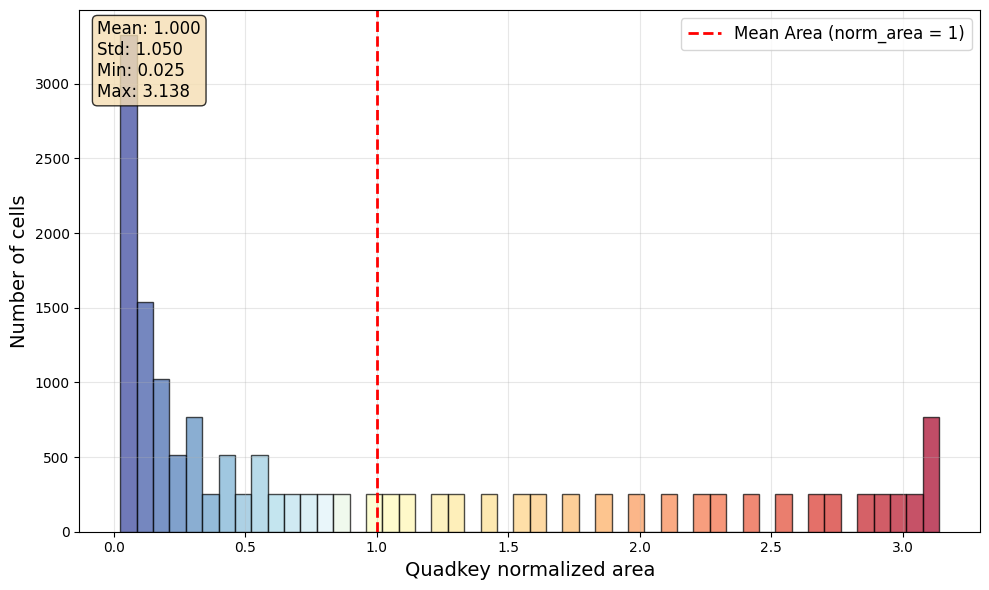

In [2]:
from vgrid.stats.quadkeystats import quadkey_norm_area_hist

quadkey_norm_area_hist(quadkey_inspect)

### Distribution of Quadkey Area Distortions

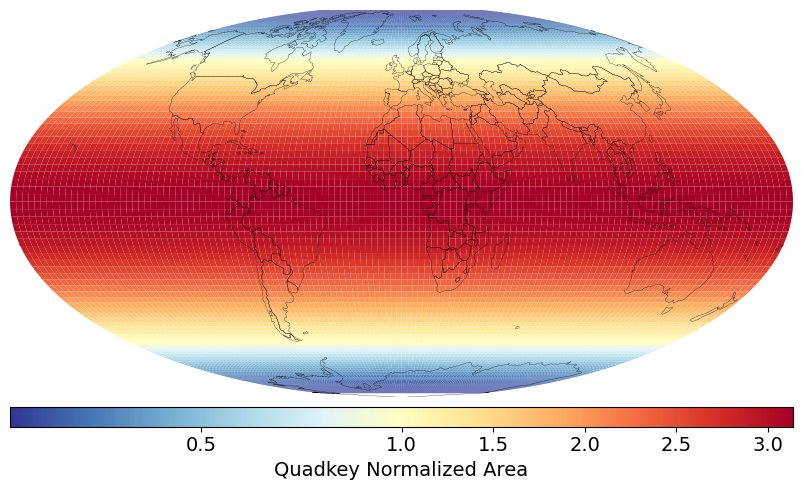

In [3]:
from vgrid.stats.quadkeystats import quadkey_norm_area

quadkey_norm_area(quadkey_inspect)

### Quadkey IPQ Compactness Histogram

Isoperimetric Inequality (IPQ) Compactness (suggested by [Osserman, 1978](https://sites.math.washington.edu/~toro/Courses/20-21/MSF/osserman.pdf)):

$$C_{IPQ} = \frac{4 \pi A}{p^2}$$
The range of the IPQ compactness metric is (0,1]. 

A circle represents the maximum compactness with a value of 1. 

As shapes become more irregular or elongated, their compactness decreases toward 0.

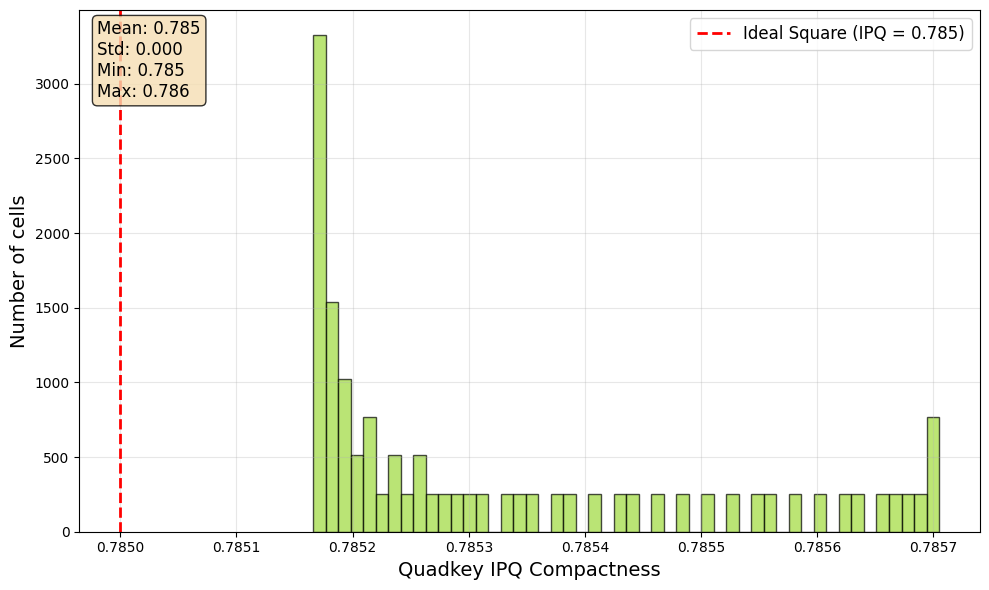

In [4]:
from vgrid.stats.quadkeystats import quadkey_compactness_ipq_hist

quadkey_compactness_ipq_hist(quadkey_inspect)

### Distribution of Quadkey IPQ Compactness

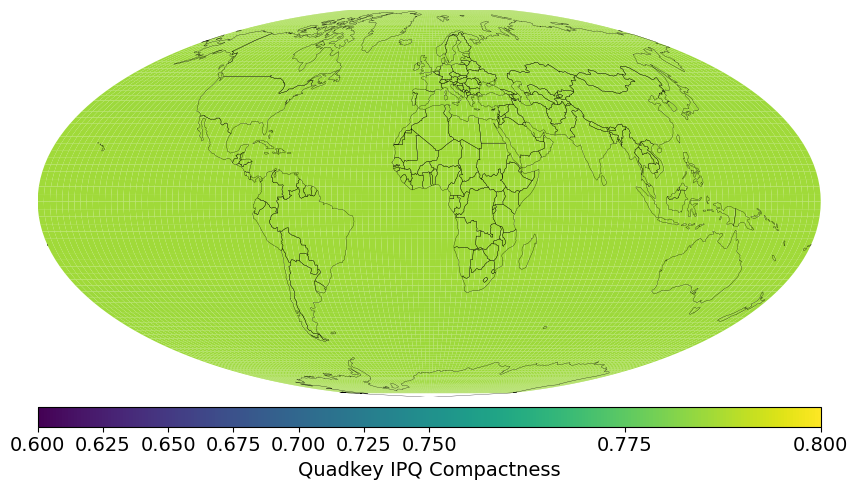

In [5]:
from vgrid.stats.quadkeystats import quadkey_compactness_ipq

quadkey_compactness_ipq(quadkey_inspect)

### Quadkey Convex hull Compactness Histogram:

$$C_{CVH} = \frac{A}{A_{CVH}}$$


The range of the convex hull compactness metric is (0,1]. 

As shapes become more concave, their convex hull compactness decreases toward 0.

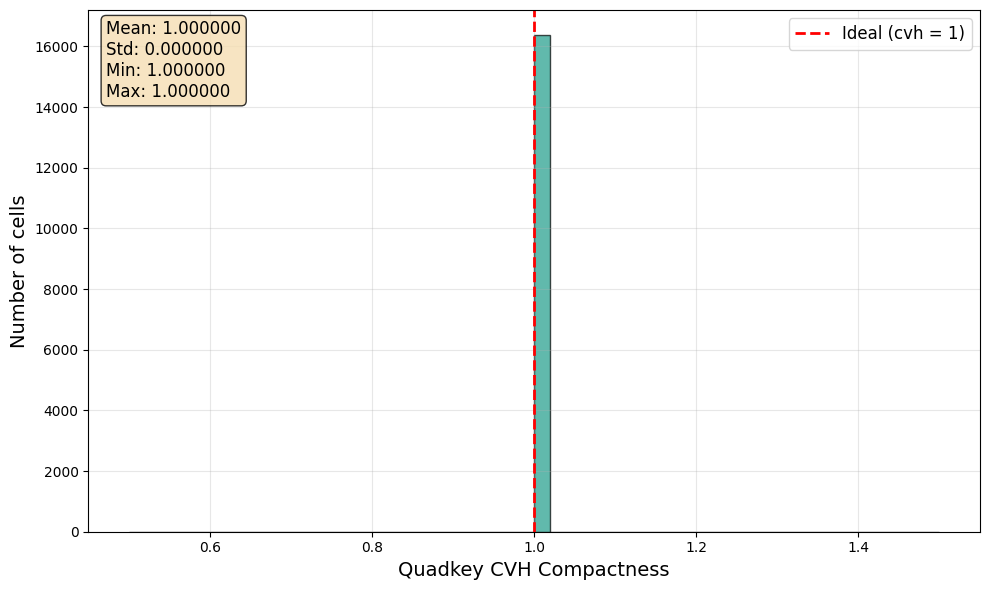

In [6]:
from vgrid.stats.quadkeystats import quadkey_compactness_cvh_hist

quadkey_compactness_cvh_hist(quadkey_inspect)

### Distribution of Quadkey Convex hull Compactness

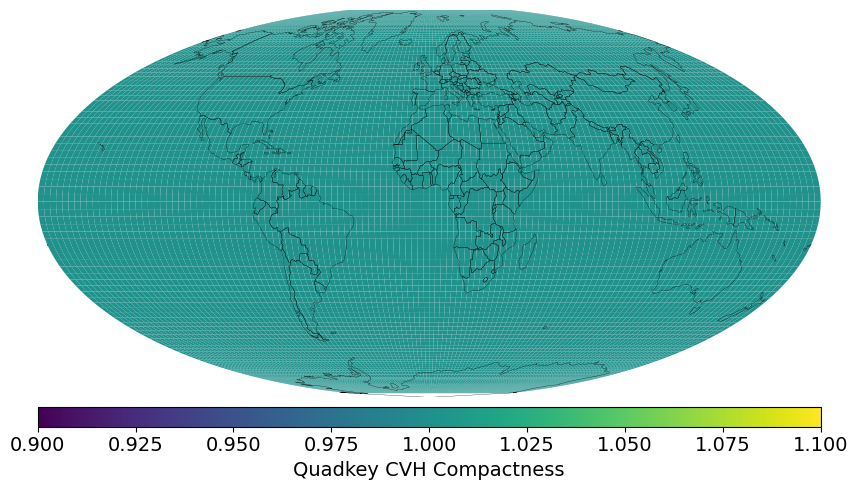

In [7]:
from vgrid.stats.quadkeystats import quadkey_compactness_cvh

quadkey_compactness_cvh(quadkey_inspect)

### Quadkey Statistics

Characteristic Length Scale (CLS - suggested by Ralph Kahn): the diameter of a spherical cap of the same cell's area

In [2]:
from vgrid.stats import quadkeystats

quadkeystats()

,resolution,number_of_cells,avg_edge_len_m,avg_cell_area_m2,cls_m
0,0,1,2.258463e+07,5.100656e+14,4.003022e+07
1,1,4,1.129232e+07,1.275164e+14,1.334341e+07
2,2,16,5.646158e+06,3.187910e+13,6.439311e+06
3,3,64,2.823079e+06,7.969775e+12,3.193858e+06
4,4,256,1.411540e+06,1.992444e+12,1.593791e+06
5,5,1024,7.057698e+05,4.981110e+11,7.965056e+05
6,6,4096,3.528849e+05,1.245277e+11,3.982042e+05
7,7,16384,1.764424e+05,3.113193e+10,1.990960e+05
8,8,65536,8.822122e+04,7.782984e+09,9.954724e+04
9,9,262144,4.411061e+04,1.945746e+09,4.977353e+04
